**Importing Required Libraries**

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from itertools import combinations
import warnings
warnings.filterwarnings('ignore')

# **Task 1**

In [31]:
df1 = pd.read_csv('/content/Task 1.csv')
df1

,product_id,factory_id,warehouse_id,shipping_cost,weight,manufacturing_cost,delay_risk,units_shipped,units_returned,avg_rating,units_sold
0,P19,F5,W4,63.25,9.23,89.11,0.28,494,43,2.00,465
1,P8,F5,W1,72.29,7.22,93.99,0.08,805,4,2.29,802
2,P6,F2,W8,NaN,6.77,72.48,0.06,197,38,1.86,182
3,P6,F1,W7,NaN,10.73,103.92,0.54,714,10,1.11,695
4,P9,F3,W3,49.56,14.39,83.86,0.49,961,18,2.45,928
...,...,...,...,...,...,...,...,...,...,...,...
999995,P11,F5,W5,30.67,9.84,65.89,0.36,962,21,4.55,928
999996,P11,F3,W8,46.03,14.42,113.28,0.30,416,7,1.64,419
999997,P3,F5,W8,63.67,9.18,60.09,0.39,668,17,2.88,673
999998,P3,F2,W5,38.33,7.83,73.19,0.27,959,7,2.78,952


**Preprocessing**

In [32]:
df1[df1.isnull().any(axis=1)] #Checking for any null values

,product_id,factory_id,warehouse_id,shipping_cost,weight,manufacturing_cost,delay_risk,units_shipped,units_returned,avg_rating,units_sold
2,P6,F2,W8,NaN,6.77,72.48,0.06,197,38,1.86,182
3,P6,F1,W7,NaN,10.73,103.92,0.54,714,10,1.11,695
126,P13,F3,W5,54.28,9.14,64.17,0.53,117,20,NaN,86
161,P11,F4,W3,NaN,10.41,108.91,0.89,803,45,2.30,770
203,P4,F3,W7,53.43,10.20,102.31,0.21,930,27,NaN,881
...,...,...,...,...,...,...,...,...,...,...,...
999724,P17,F5,W10,NaN,14.08,128.12,0.05,236,21,2.87,219
999789,P1,F3,W9,28.43,7.75,95.19,0.78,361,44,NaN,306
999802,P13,F2,W8,NaN,8.41,109.73,0.64,256,6,4.49,272
999868,P7,F1,W3,53.50,7.86,150.48,0.58,955,21,NaN,967


In [33]:
df1.dropna(inplace=True)
df1.drop_duplicates(inplace=True)
df1.isnull().values.any()

np.False_

**Drawing a heatmap To see the correlation between different columns**

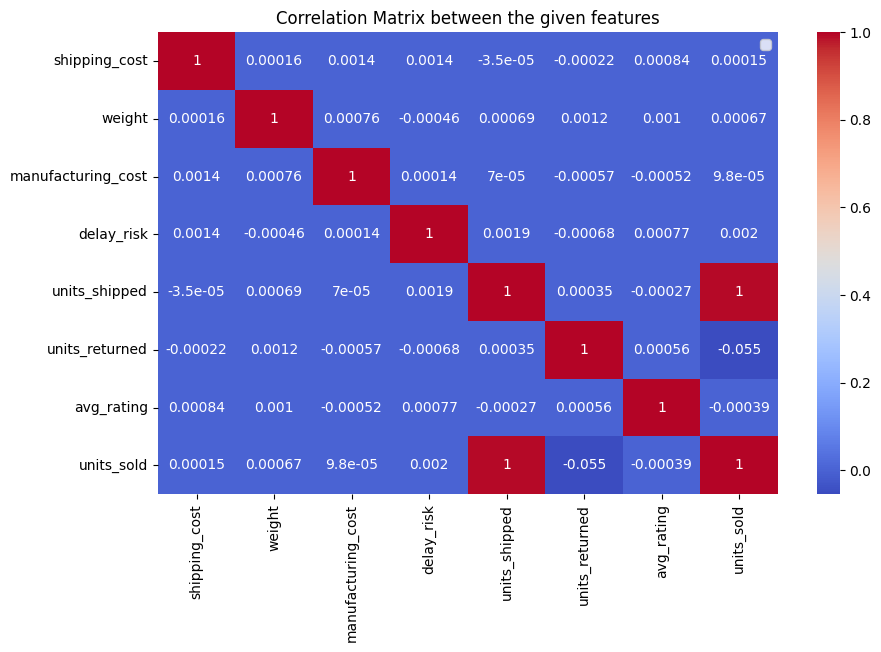

In [34]:
numeric_df1 = df1.select_dtypes(include=[np.number])
plt.figure(figsize=(10,6))
sns.heatmap(numeric_df1.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Matrix between the given features')
plt.legend()
plt.show()

**Plot between Units shipped v/s Units sold**

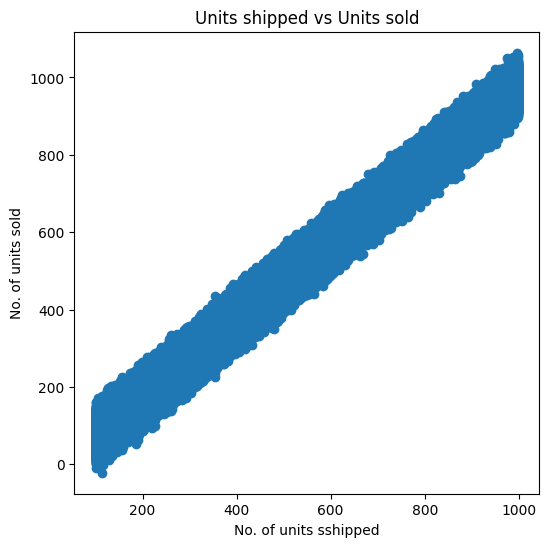

In [35]:
plt.figure(figsize=(6,6))
plt.scatter(df1['units_shipped'],df1['units_sold'])
plt.xlabel('No. of units sshipped')
plt.ylabel('No. of units sold')
plt.title('Units shipped vs Units sold')
plt.show()

**Plot between Manufacturing Cost v/s Units sold**

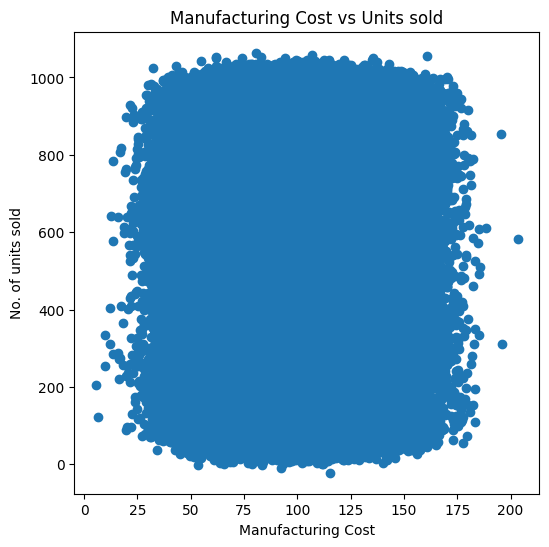

In [36]:
plt.figure(figsize=(6,6))
plt.scatter(df1['manufacturing_cost'],df1['units_sold'])
plt.xlabel('Manufacturing Cost')
plt.ylabel('No. of units sold')
plt.title('Manufacturing Cost vs Units sold')
plt.show()

### **Linear Regression**

$$
\hat{y} = X\beta
$$

Cost function (MSE):

$$
J(\beta) = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 = \|y - X\beta\|^2
$$


In [37]:
linreg = LinearRegression() # Using the Linear Regression Model
X1_train, X1_test, y1_train, y1_test = train_test_split(df1.drop(columns=['units_sold','product_id','factory_id','warehouse_id']), df1['units_sold'], test_size=0.2, random_state=42)
linreg.fit(X1_train, y1_train)
y1_pred = linreg.predict(X1_test)
mse = mean_squared_error(y1_test, y1_pred)
r2 = r2_score(y1_test, y1_pred)
print('Mean Squared Error:', mse)
print('R-squared:', r2)

Mean Squared Error: 398.57351264455093
R-squared: 0.994162007663682


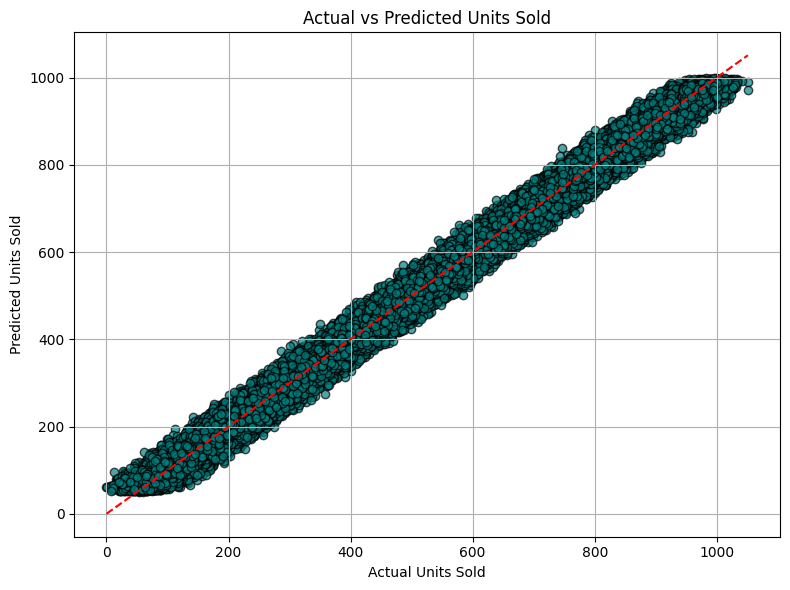

In [38]:
plt.figure(figsize=(8, 6))
plt.scatter(y1_test, y1_pred, alpha=0.7, color='teal', edgecolors='k')
plt.xlabel("Actual Units Sold")
plt.ylabel("Predicted Units Sold")
plt.title("Actual vs Predicted Units Sold")
plt.plot([y1_test.min(), y1_test.max()], [y1_test.min(), y1_test.max()], 'r--')  # 45-degree line
plt.grid(True)
plt.tight_layout()
plt.show()

###**Ridge Regression:**

$$
J(\beta) = \|y - X\beta\|^2 + \lambda \|\beta\|_2^2
$$

Where:
- $\|\beta\|_2^2 = \sum_{j=1}^{p} \beta_j^2 $
- $\lambda \geq 0  $  is the regularization parameter


In [39]:
rid = Ridge(alpha=1.0) # Using the Ridge Regression Model
rid.fit(X1_train, y1_train)
y2_pred = rid.predict(X1_test)
mse = mean_squared_error(y1_test, y2_pred)
r2 = r2_score(y1_test, y2_pred)
print('Mean Squared Error:', mse)
print('R-squared:', r2)

Mean Squared Error: 398.57351260832587
R-squared: 0.9941620076642126


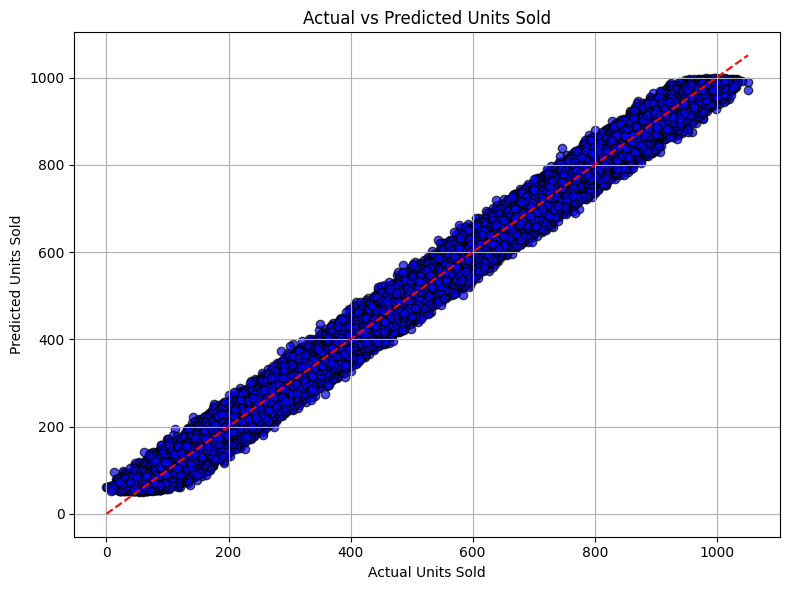

In [40]:
plt.figure(figsize=(8, 6))
plt.scatter(y1_test, y2_pred, alpha=0.7, color='blue', edgecolors='k')
plt.xlabel("Actual Units Sold")
plt.ylabel("Predicted Units Sold")
plt.title("Actual vs Predicted Units Sold")
plt.plot([y1_test.min(), y1_test.max()], [y1_test.min(), y1_test.max()], 'r--')  # 45-degree line
plt.grid(True)
plt.tight_layout()
plt.show()

###**Lasso Regression:**

$$
J(\beta) = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} |\beta_j|
$$

Or, using vector notation:

$$
J(\beta) = \|y - X\beta\|^2 + \lambda \|\beta\|_1
$$

Where:
- $\|y - X\beta\|^2 = (y - X\beta)^\top (y - X\beta) = \sum_{i=1}^{n} (y_i - X_i^\top \beta)^2$
- $\|\beta\|_1 = \sum_{j=1}^{p} |\beta_j|$

- $\lambda \geq 0 $

In [41]:
las = Lasso(alpha = 0.2) # Using the Ridge Regression Model
las.fit(X1_train, y1_train)
y3_pred = rid.predict(X1_test)
mse = mean_squared_error(y1_test, y3_pred)
r2 = r2_score(y1_test, y3_pred)
print('Mean Squared Error:', mse)
print('R-squared:', r2)

Mean Squared Error: 398.57351260832587
R-squared: 0.9941620076642126


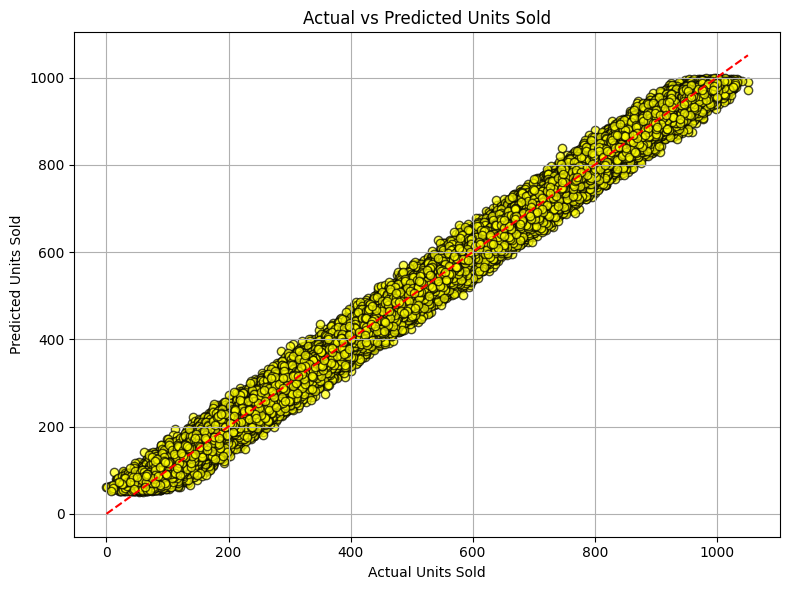

In [42]:
plt.figure(figsize=(8, 6))
plt.scatter(y1_test, y3_pred, alpha=0.7, color='yellow', edgecolors='k')
plt.xlabel("Actual Units Sold")
plt.ylabel("Predicted Units Sold")
plt.title("Actual vs Predicted Units Sold")
plt.plot([y1_test.min(), y1_test.max()], [y1_test.min(), y1_test.max()], 'r--')  # 45-degree line
plt.grid(True)
plt.tight_layout()
plt.show()

# **Task 2**

In [43]:
df2 = pd.read_csv('/content/Task 2.csv')
df2

,product_A_qty,product_B_qty,product_C_qty,product_D_qty,product_E_qty,product_F_qty,product_G_qty,product_H_qty,product_I_qty,product_J_qty,warehouse_id
0,10.0,94.0,46.0,82.0,286.0,20.0,137.0,76.0,273.0,181.0,W1
1,131.0,209.0,268.0,285.0,172.0,211.0,188.0,157.0,203.0,263.0,W2
2,380.0,93.0,400.0,276.0,226.0,336.0,274.0,116.0,203.0,239.0,W3
3,1.0,139.0,76.0,330.0,107.0,159.0,24.0,186.0,280.0,77.0,W4
4,253.0,78.0,161.0,338.0,258.0,201.0,131.0,210.0,351.0,177.0,W5
...,...,...,...,...,...,...,...,...,...,...,...
9995,167.0,196.0,176.0,223.0,299.0,162.0,173.0,367.0,290.0,242.0,W9996
9996,170.0,-20.0,144.0,252.0,316.0,304.0,434.0,150.0,55.0,118.0,W9997
9997,206.0,397.0,89.0,57.0,246.0,377.0,173.0,221.0,333.0,168.0,W9998
9998,183.0,382.0,122.0,255.0,262.0,369.0,251.0,421.0,126.0,177.0,W9999


**Preprocessing**

In [44]:
df2[df2.isnull().any(axis=1)]

,product_A_qty,product_B_qty,product_C_qty,product_D_qty,product_E_qty,product_F_qty,product_G_qty,product_H_qty,product_I_qty,product_J_qty,warehouse_id
22,281.0,417.0,NaN,35.0,298.0,264.0,218.0,280.0,278.0,165.0,W23
27,160.0,118.0,NaN,232.0,325.0,251.0,123.0,269.0,205.0,114.0,W28
280,279.0,210.0,NaN,168.0,256.0,282.0,10.0,176.0,226.0,164.0,W281
363,344.0,202.0,NaN,352.0,274.0,148.0,234.0,66.0,68.0,282.0,W364
380,110.0,112.0,NaN,120.0,300.0,103.0,222.0,47.0,164.0,134.0,W381
...,...,...,...,...,...,...,...,...,...,...,...
9699,46.0,248.0,NaN,44.0,281.0,271.0,-8.0,258.0,232.0,227.0,W9700
9786,136.0,227.0,NaN,47.0,181.0,179.0,187.0,310.0,103.0,248.0,W9787
9804,166.0,188.0,NaN,74.0,233.0,203.0,222.0,327.0,182.0,178.0,W9805
9866,161.0,151.0,NaN,200.0,315.0,199.0,49.0,146.0,193.0,376.0,W9867


In [45]:
numeric_df2 = df2.select_dtypes(include=[np.number]) # Looking for any negative numbers since Quantity cannot be negative
negative_rows = df2[numeric_df2.lt(0).any(axis=1)]
negative_rows

,product_A_qty,product_B_qty,product_C_qty,product_D_qty,product_E_qty,product_F_qty,product_G_qty,product_H_qty,product_I_qty,product_J_qty,warehouse_id
16,201.0,-9.0,149.0,253.0,86.0,214.0,170.0,215.0,137.0,237.0,W17
20,34.0,148.0,333.0,296.0,166.0,342.0,162.0,138.0,-9.0,155.0,W21
31,114.0,87.0,318.0,234.0,16.0,144.0,-5.0,93.0,409.0,262.0,W32
34,232.0,384.0,82.0,115.0,387.0,-8.0,159.0,229.0,184.0,204.0,W35
35,280.0,68.0,101.0,273.0,374.0,174.0,261.0,-10.0,10.0,241.0,W36
...,...,...,...,...,...,...,...,...,...,...,...
9941,325.0,253.0,357.0,-4.0,123.0,128.0,192.0,358.0,103.0,160.0,W9942
9951,218.0,203.0,163.0,231.0,315.0,-4.0,108.0,189.0,-20.0,485.0,W9952
9953,70.0,278.0,165.0,200.0,144.0,304.0,260.0,405.0,314.0,-3.0,W9954
9958,175.0,292.0,300.0,379.0,274.0,-6.0,261.0,247.0,339.0,125.0,W9959


In [46]:
df2.drop(negative_rows.index, inplace=True)
df2.dropna(inplace=True)
df2.drop_duplicates(inplace=True)
df2.isnull().values.any()

np.False_

**K means Clustering (K = 3)**

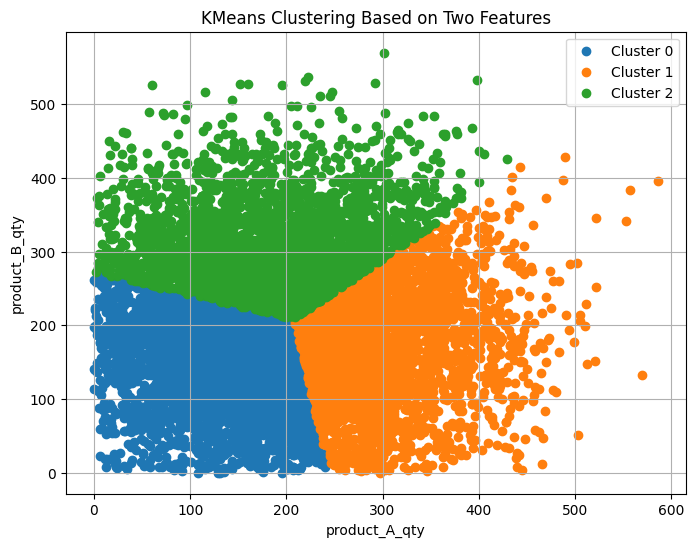

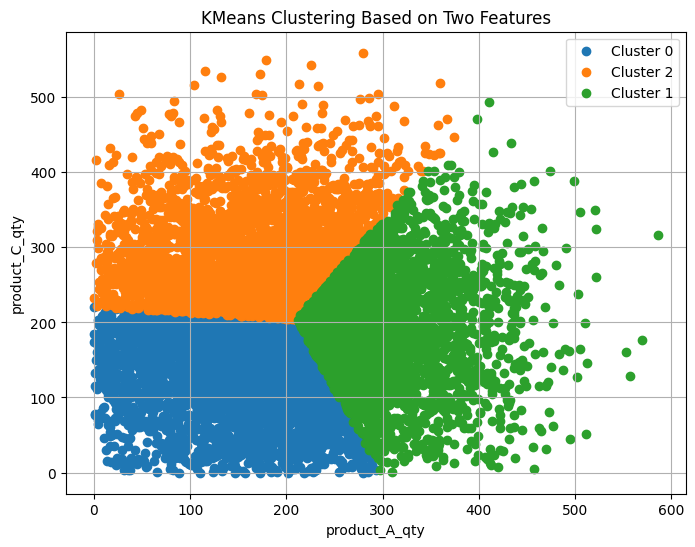

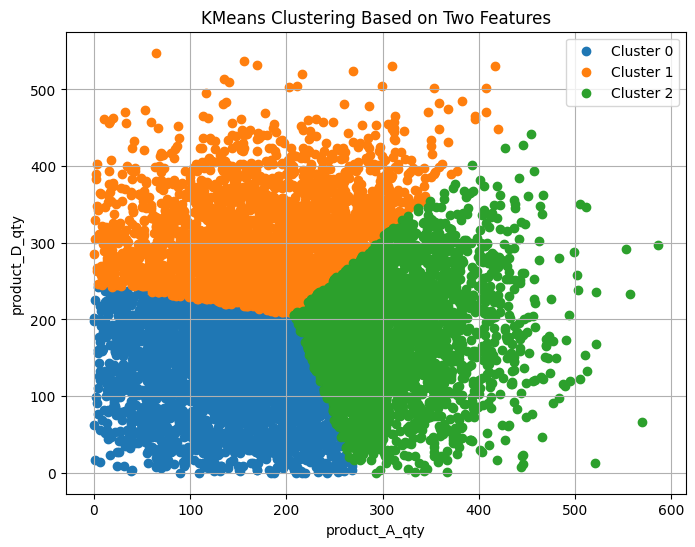

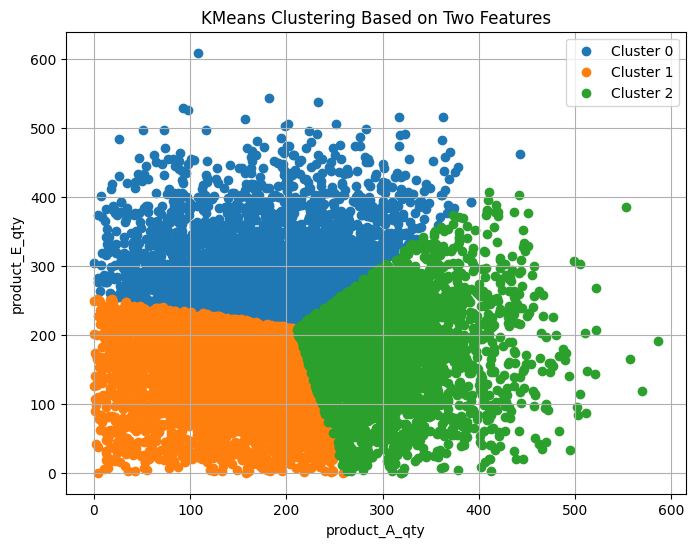

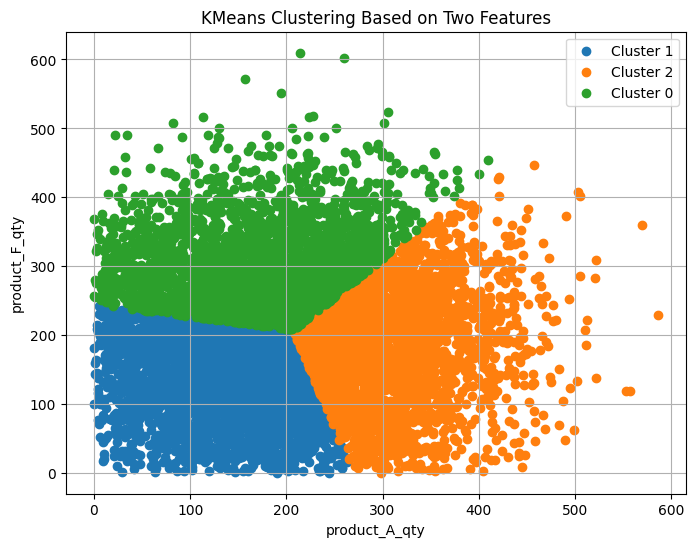

...

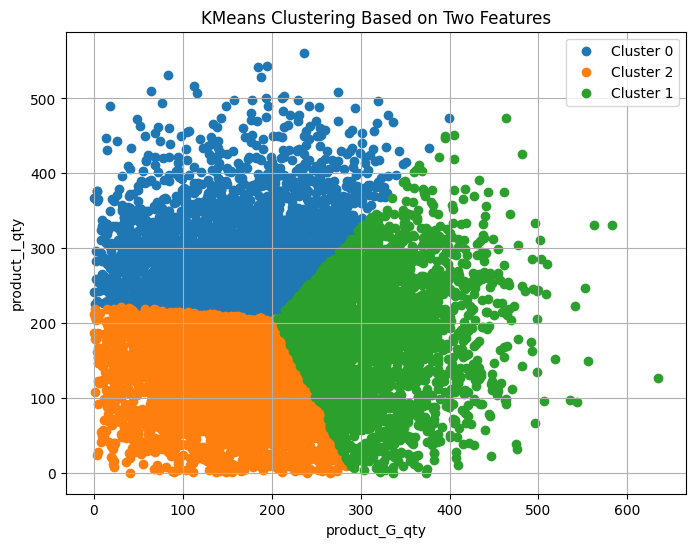

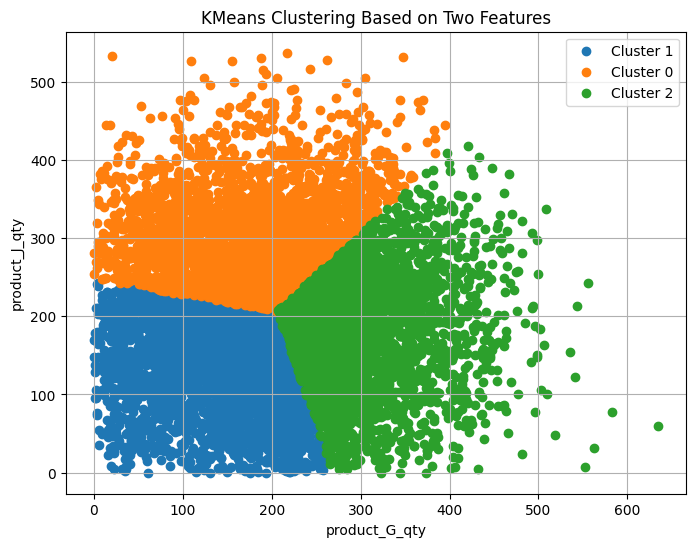

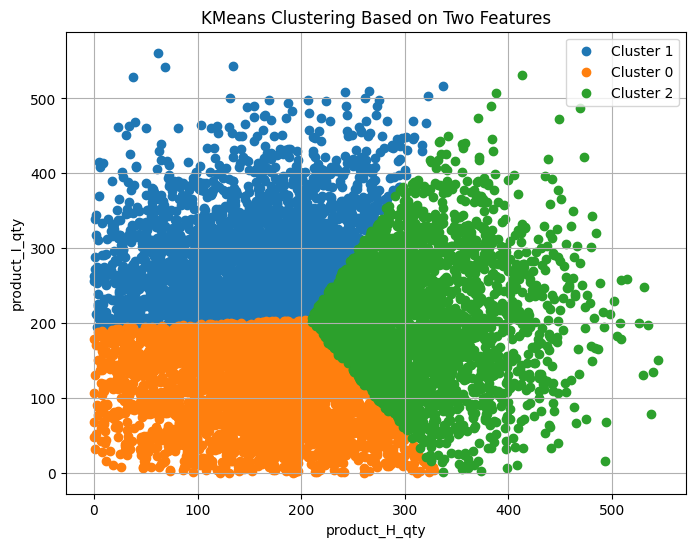

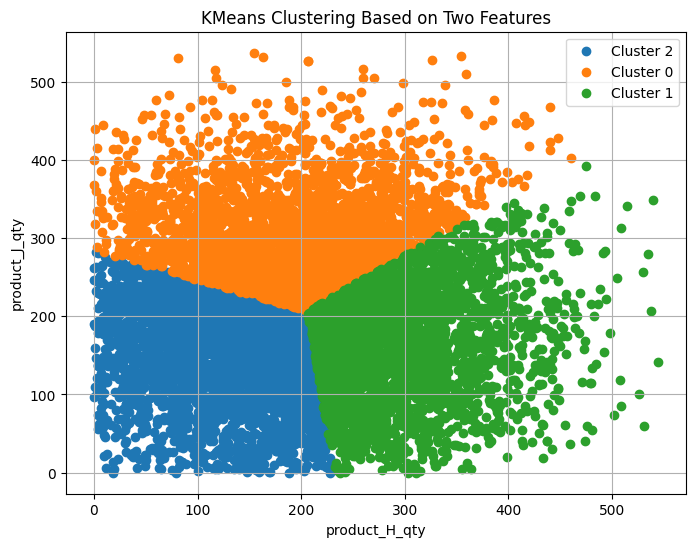

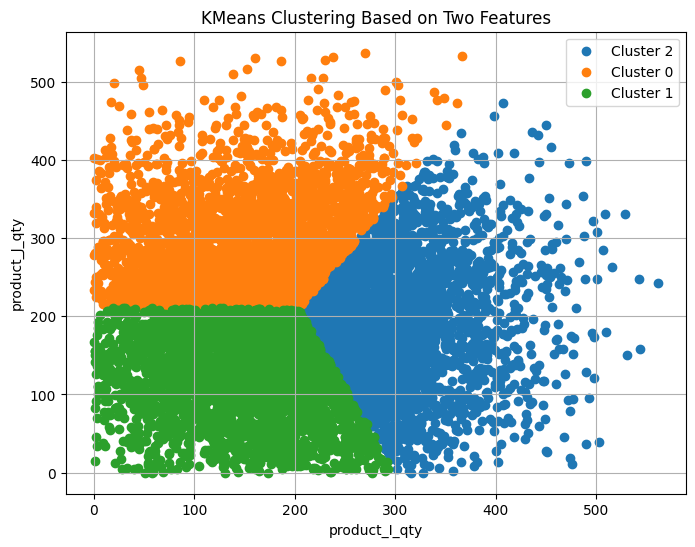

In [47]:
numeric_df2_2 = df2.select_dtypes(include=[np.number]).columns
for col1,col2 in combinations(numeric_df2_2,2):
 selected_features = df2[[col1, col2]].dropna()

 std = StandardScaler()
 scaled_features = StandardScaler().fit_transform(selected_features)

 kmeans = KMeans(n_clusters=3, random_state=42)
 df2['Cluster'] = kmeans.fit_predict(scaled_features)

 plt.figure(figsize=(8,6))

 for cluster in df2['Cluster'].unique():
    cluster_data = df2[df2['Cluster'] == cluster]
    plt.scatter(cluster_data[col1], cluster_data[col2], label=f'Cluster {cluster}')

 plt.xlabel(col1)
 plt.ylabel(col2)
 plt.title('KMeans Clustering Based on Two Features')
 plt.legend()
 plt.grid(True)
 plt.show()

**K means Clustering (K = 4)**

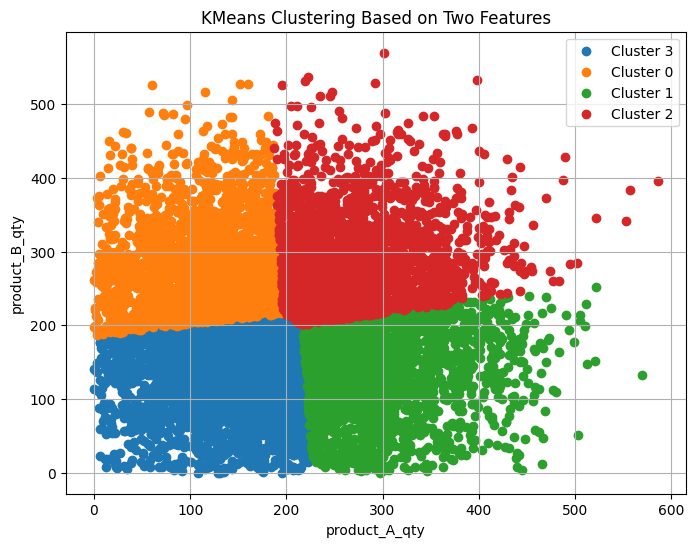

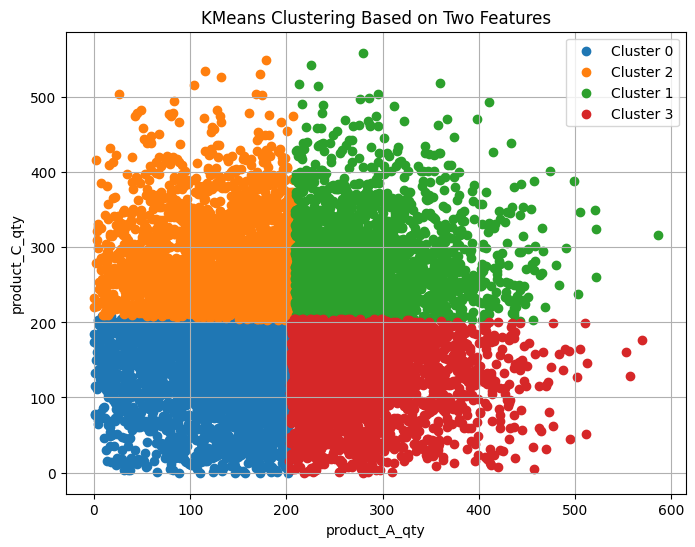

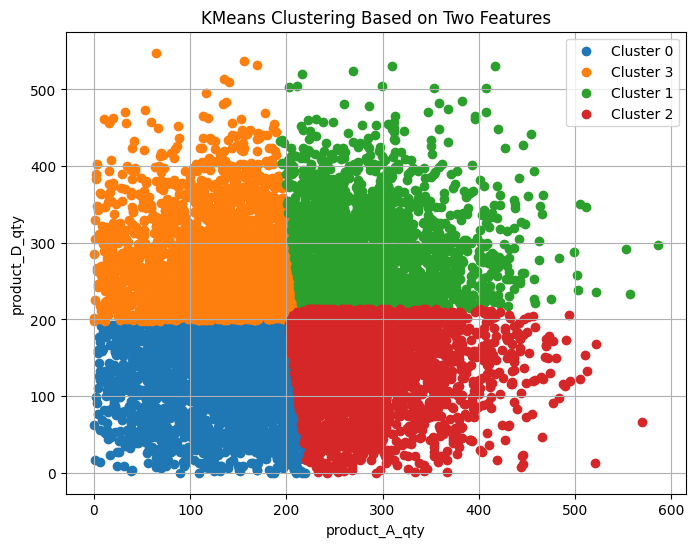

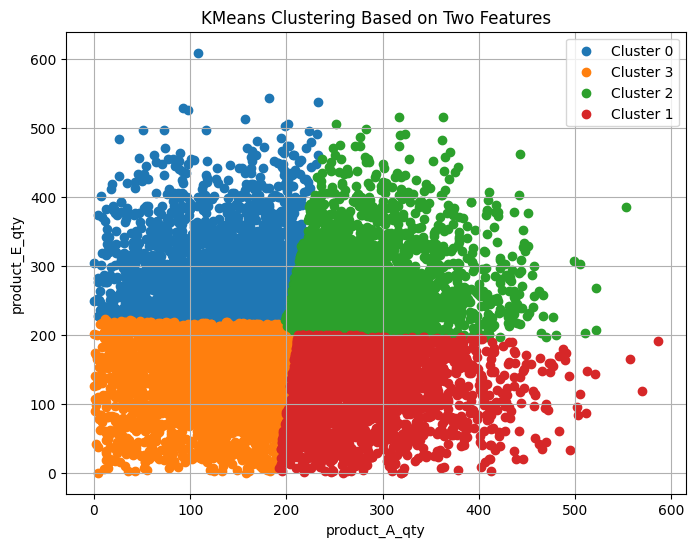

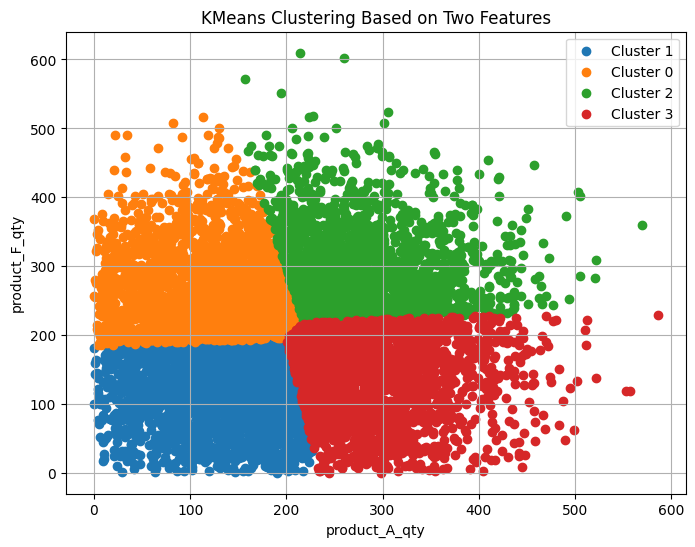

...

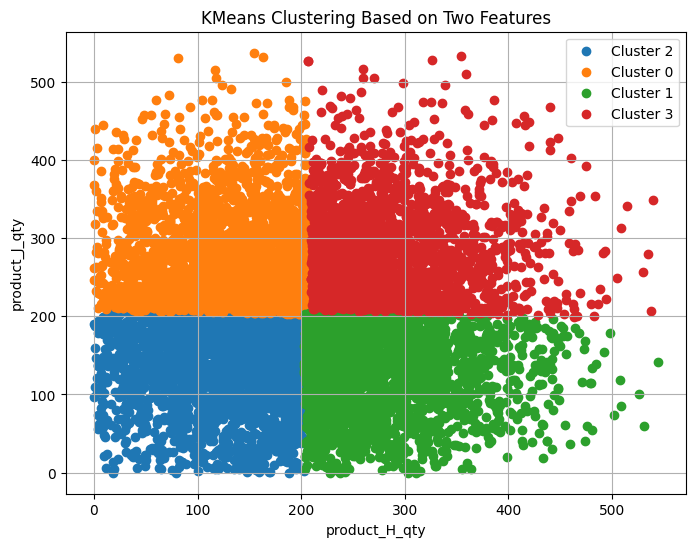

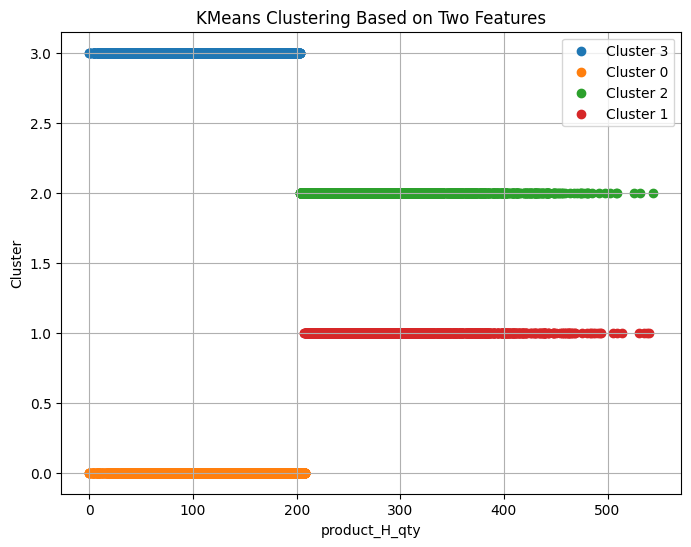

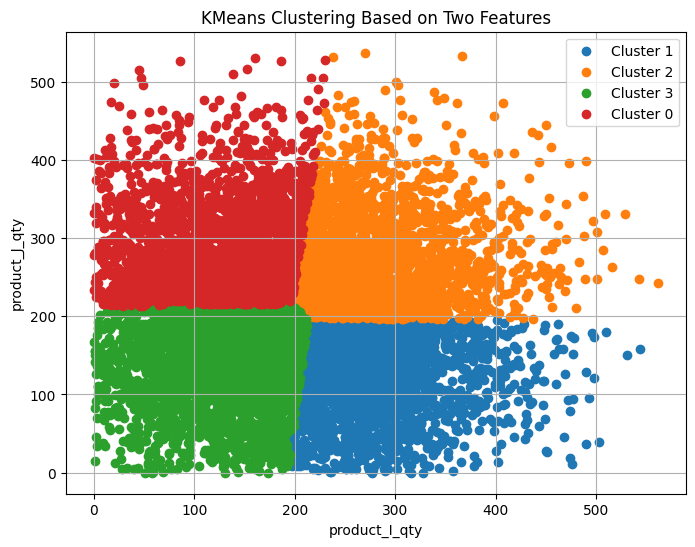

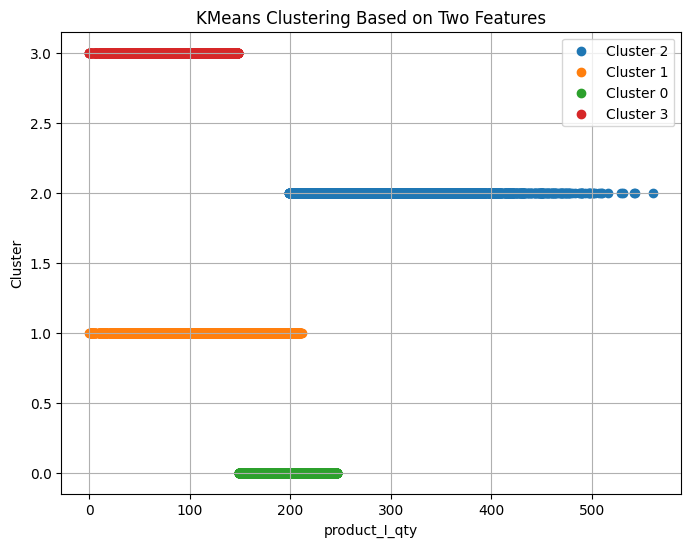

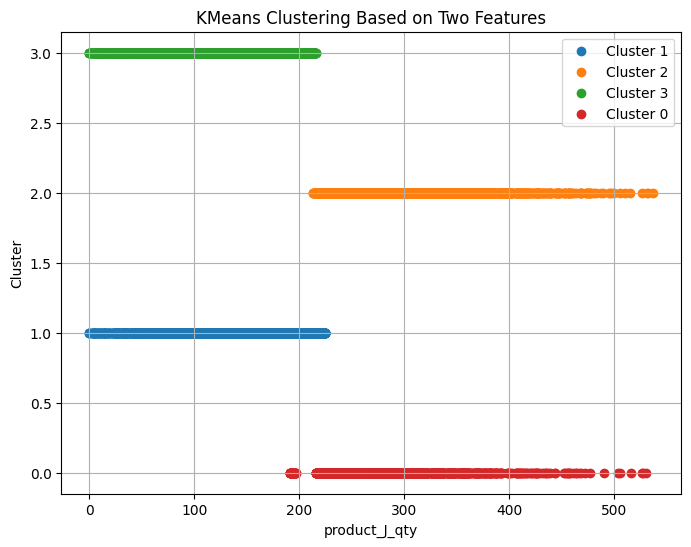

In [48]:
numeric_df2_2 = df2.select_dtypes(include=[np.number]).columns
for col1,col2 in combinations(numeric_df2_2,2):
 selected_features = df2[[col1, col2]].dropna()

 std = StandardScaler()
 scaled_features = StandardScaler().fit_transform(selected_features)

 kmeans = KMeans(n_clusters=4, random_state=42)
 df2['Cluster'] = kmeans.fit_predict(scaled_features)

 plt.figure(figsize=(8,6))

 for cluster in df2['Cluster'].unique():
    cluster_data = df2[df2['Cluster'] == cluster]
    plt.scatter(cluster_data[col1], cluster_data[col2], label=f'Cluster {cluster}')

 plt.xlabel(col1)
 plt.ylabel(col2)
 plt.title('KMeans Clustering Based on Two Features')
 plt.legend()
 plt.grid(True)
 plt.show()

**K means Clustering (K = 5)**

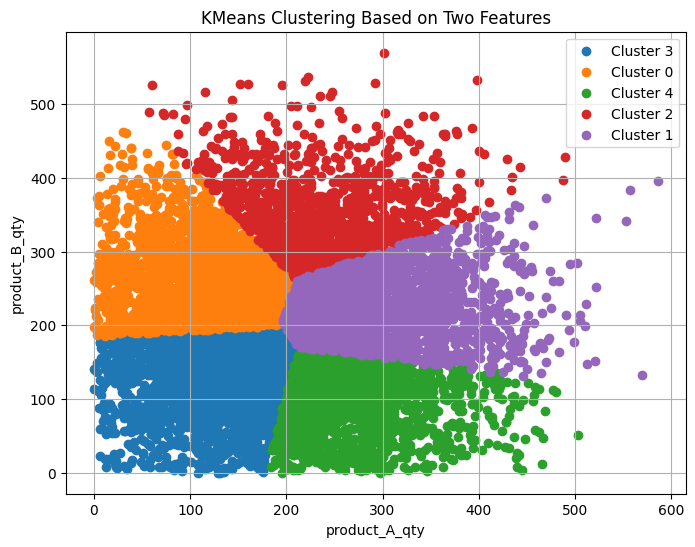

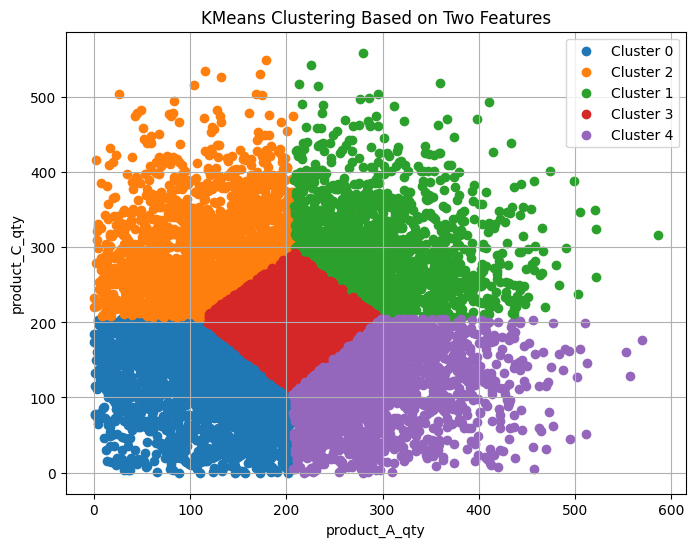

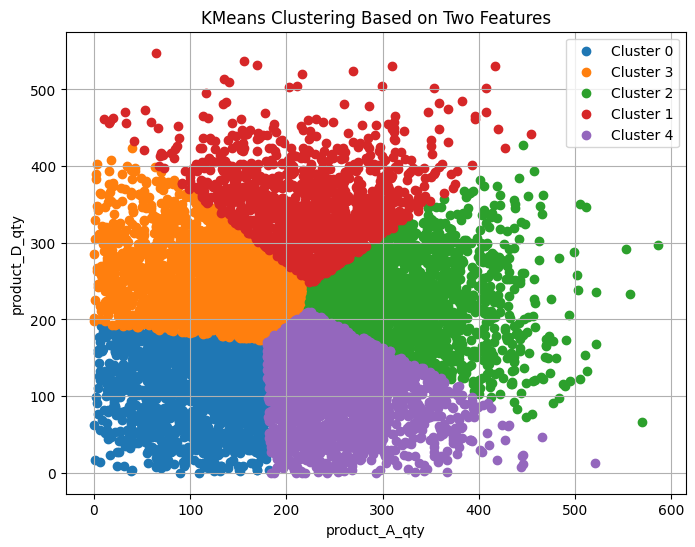

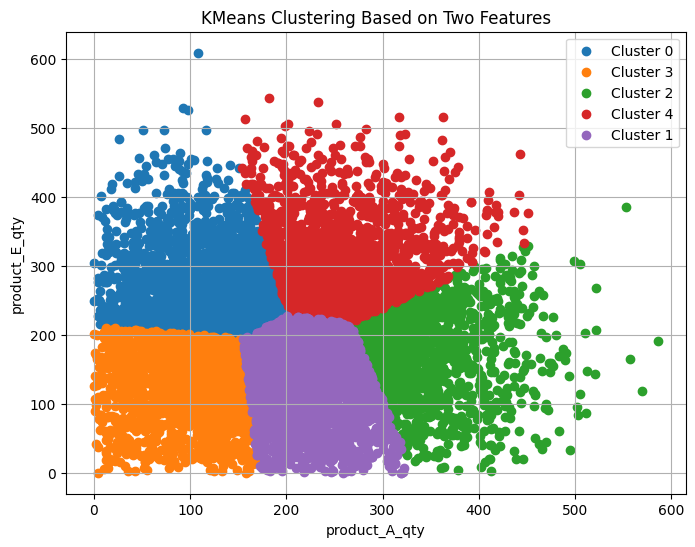

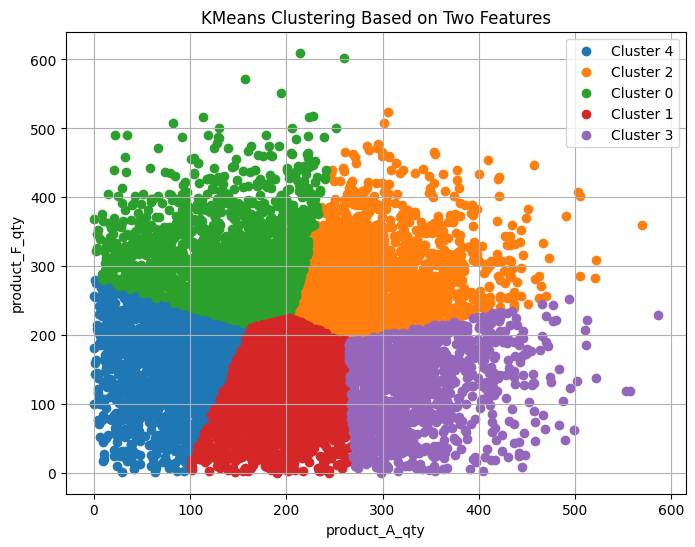

...

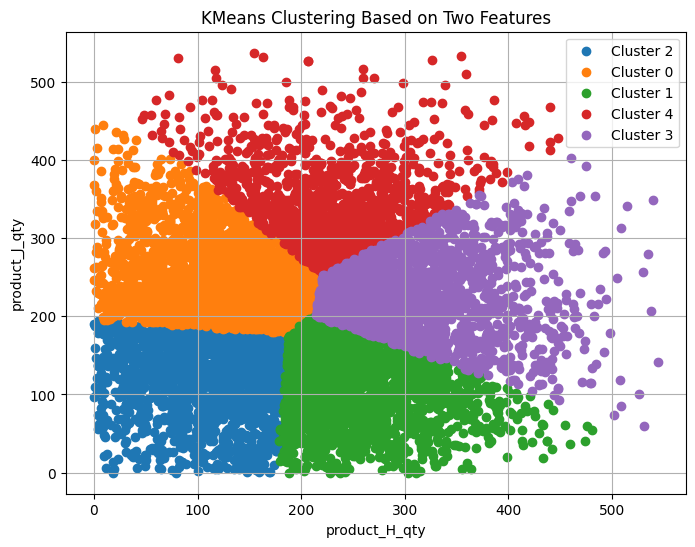

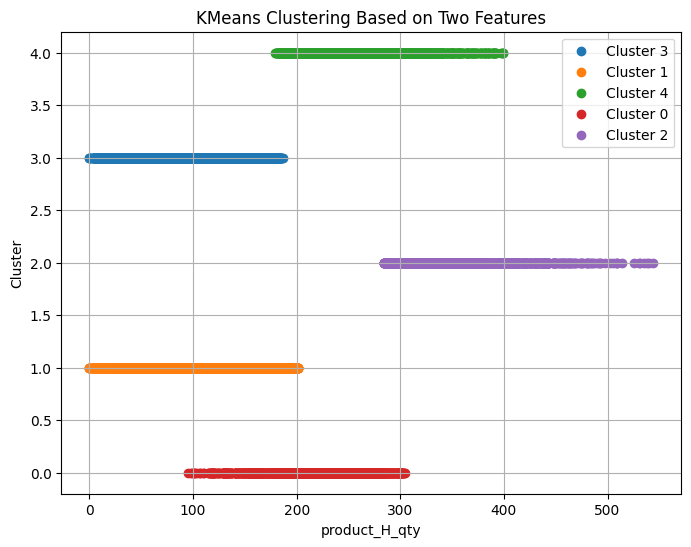

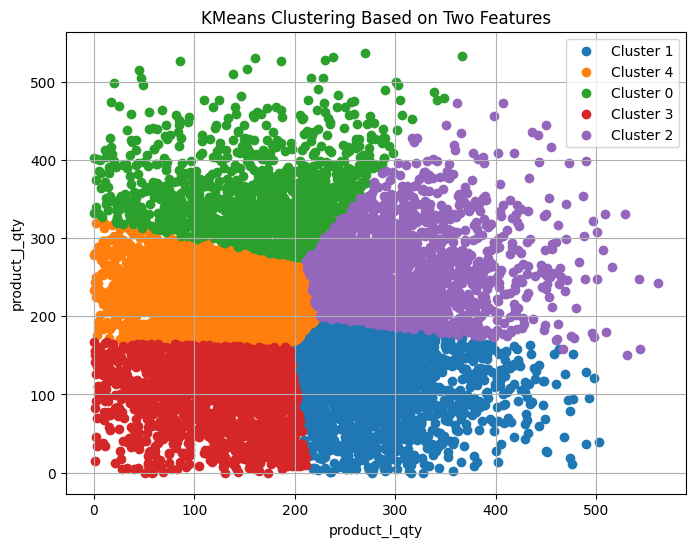

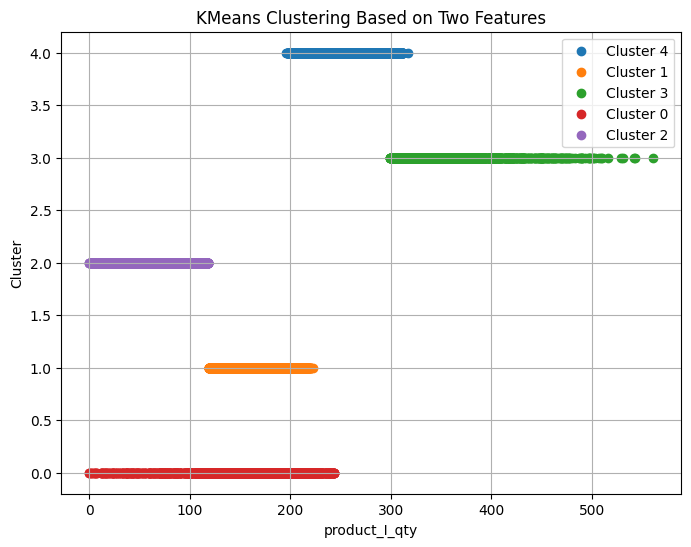

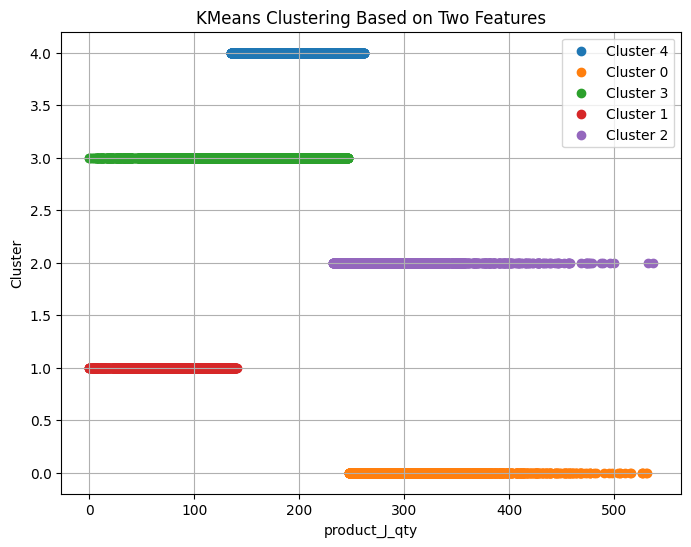

In [49]:
numeric_df2_2 = df2.select_dtypes(include=[np.number]).columns
for col1,col2 in combinations(numeric_df2_2,2):
 selected_features = df2[[col1, col2]].dropna()

 std = StandardScaler()
 scaled_features = StandardScaler().fit_transform(selected_features)

 kmeans = KMeans(n_clusters=5, random_state=42)
 df2['Cluster'] = kmeans.fit_predict(scaled_features)

 plt.figure(figsize=(8,6))

 for cluster in df2['Cluster'].unique():
    cluster_data = df2[df2['Cluster'] == cluster]
    plt.scatter(cluster_data[col1], cluster_data[col2], label=f'Cluster {cluster}')

 plt.xlabel(col1)
 plt.ylabel(col2)
 plt.title('KMeans Clustering Based on Two Features')
 plt.legend()
 plt.grid(True)
 plt.show()